# 1. Via 2.0 Cartography on Mouse Gastrulation
Time-series RNA-seq data with RNA velocity of E6.5-E8.5 murine gastrulation (Sala 2019)

In [3]:
#Import packages
import scanpy as sc
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import core_working_rw2 as via #soon to be released
from datetime import datetime

### Load the data

Data has been filtered and library normalized. PCA has been computed and stored in the anndata object. PCA was performed on all genes remaining after filtering
Data is annotated with time/stage, cluster labels, and cell type labels (coarse and fine)
Requires XXXGB RAM to load
 

In [4]:
print(f'{datetime.now()}\tStart reading data')
adata=sc.read_h5ad( filename='/home/user/Trajectory/Datasets/Pijuan_Gastrulation/pijuan_gastrulation_via.h5ad')

print(f'{datetime.now()}\tFinished reading data')
print(adata)

2023-09-20 09:58:11.741389	Start reading data
2023-09-20 09:58:26.430943	Finished reading data
AnnData object with n_obs × n_vars = 89267 × 10766
    obs: 'barcode', 'sample', 'stage', 'sequencing.batch', 'theiler', 'doub.density', 'doublet', 'cluster', 'cluster.sub', 'cluster.stage', 'cluster.theiler', 'stripped', 'celltype', 'colour', 'umapX', 'umapY', 'haem_gephiX', 'haem_gephiY', 'haem_subclust', 'endo_gephiX', 'endo_gephiY', 'endo_trajectoryName', 'endo_trajectoryDPT', 'endo_gutX', 'endo_gutY', 'endo_gutDPT', 'endo_gutCluster', 'cell_velocyto_loom', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_counts', 'velocity_self_transition', 'stage_num', 'celltype_parc', 'parc', 'celltype_coarse'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'gene_count_corr', 'velocity_gamma', 'velocity_qreg_ratio', 'velocity_r2', 'velocity_genes'
    uns: 'neighbors', 'pca', 'velocity_graph', 'velocity_graph_neg', 'velocity_params'
    obsm: 'RW2_features', 'X_Via2_at

### Take a look at the data using the stored Atlas single-cell embedding

2023-09-20 16:09:20.715428	Start plotting the saved via2 atlas embedding
coarse cell_type {'Ectoderm', 'Allantois', 'Endothelium', 'Neural', 'Mesenchyme', 'Cardiomyocytes', 'Mesoderm', 'Blast', 'Blood', 'Endoderm'}


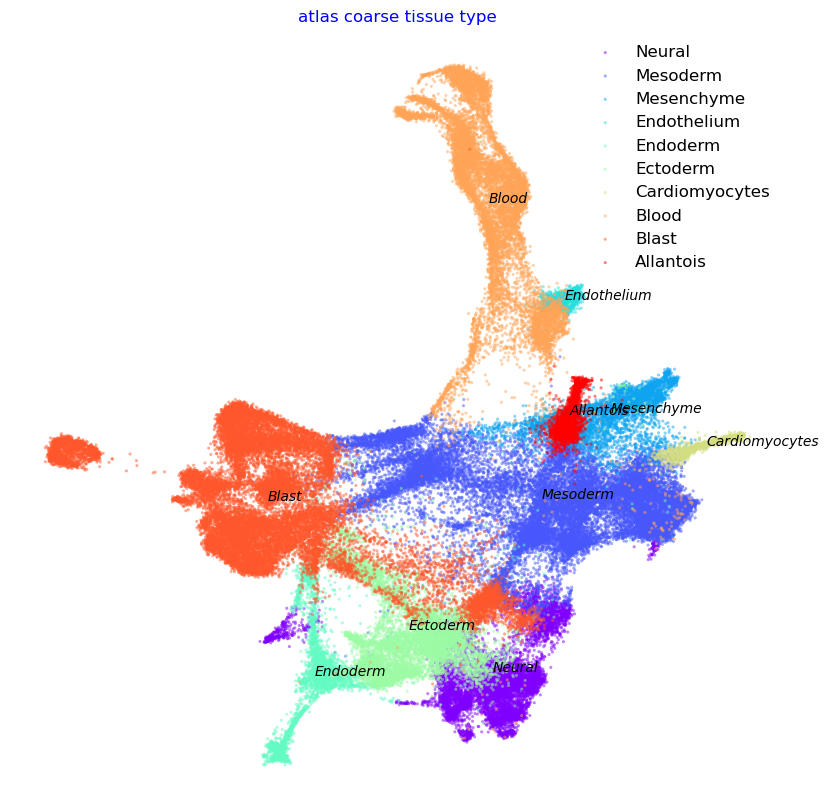

In [27]:
#plot the stored atlas embeddings by stage and cell type
print(f'{datetime.now()}\tStart plotting the saved via2 atlas embedding')
stage_label_numeric = [i for i in adata.obs['stage_num']]
cell_type_label = [i for i in     adata.obs['celltype']]

coarse_cell_type_label= [i for i in adata.obs['celltype_coarse']]
print('coarse cell_type', set(coarse_cell_type_label))
'''
#color by stage
f1, ax = via.plot_scatter(embedding=adata.obsm['X_Via2_atlas'] , labels=stage_label_numeric, cmap='plasma', s=5,
                          alpha=0.5, edgecolors='None',
                          title='atlas', text_labels=False)
f1.set_size_inches(10, 10)
'''

f2, ax = via.plot_scatter(embedding=adata.obsm['X_Via2_atlas'] , labels=coarse_cell_type_label, title='atlas coarse tissue type',
                          alpha=0.5, s=5)
f2.set_size_inches(10, 10)


### Set parameters for Via 2.0

***A quick note on how to (auto) set the root***
1. group level user-defined suggestion: e.g. root = ['Epiblast'] The group level root assignment must correspond to a label that exists in the True-label parameter (must be passed inside a list). 
2. For autodetection based on rna-velocity root can be left as None.  Since we will be using the velocity matrices (see below), Via 2.0 will suggest a list of likely root cell states that the user can decide to choose between. It is helpful to examine the top 5 suggested roots and choose the one that seems most reasonable. Note in the output that Via 2.0's suggestions are almost all in the epibliast or Primitive streak state 
3. A single cell index can also be passed e.g. [256], means the 256th cell will be used as a root.

In [6]:
#set parameters for Via 2.0
q_memory=100
cluster_graph_pruning_std = 0.15 #level of pruning done on the cluster graph. higher number means less pruning (values can range from 0-3 standard deviations)
jac_std_global = 0.15  # regulates number of clusters. Higher values means fewer clusters (values can range from 0-3 standard deviations)
random_seed = 42 
knn = 30  # number of neighbors in the knn graph
knn_sequential = 15  # number of neighbors additionally created between sequentially adjacent time points 
n_pcs = 30 # number of principal components
velo_weight = 0.5  # 0.7 #weight given to velocity based direction compared to pseudotime based direction
t_diff_step = 2 #edges extending between nodes that are more than 2 time steps apart will be removed (i.e. equal to 3 or more time steps apart)
root = ['Epiblast_13'] #for reproducability we set the root here. the group level root assignment must correspond to a label that exists in the True-label parameter (must be passed inside a list). For autodetection based on rna-velocity it can be left as None. A single cell index can also be passed e.g. [256], means the 256th cell will be used as a root. Since we will be using the velocity matrices (see below), Via 2.0 will suggest a list of likely root cell states that the user can decide to choose between. It is helpful to examine the top 5 suggested roots and choose the one that seems most reasonable. Note in the output that Via 2.0's suggestions are almost all in the epibliast or Primitive streak state 
neighboring_terminal_states_threshold = 4
max_visual_outgoing_edges = 10#5 #used in differentiation flow chart plots
time_series = True

#get velocity and gene_matrices
subset = np.ones(adata.n_vars, bool)
subset &= np.array(adata.var["velocity_genes"].values, dtype=bool)
gene_matrix = np.asmatrix(adata.layers['Ms'][:, subset])  # None
velocity_matrix = adata.layers['velocity'][:, subset]  # None
cluster_celltype_label = [i for i in adata.obs['celltype_parc']]

#For reproducability we set the terminal states based on previous runs of Via 2.0 where the following cell fates were identified. This parameter can be left blank and a similar set of terminal states will be retrieved. This allows the user to control which suggested terminal states they are actually interested in or remove "duplicate" terminal states. The items in the list must correspond to items in the true_label list passed to Via 2.0. 
user_defined_terminal_group_auto = ['Erythroid3_48',
                                    'Erythroid3_12', 'Erythroid3_55',
                                    'Haematoendothelial progenitors_26',
                                    'Haematoendothelial progenitors_42', 'Haematoendothelial progenitors_61',
                                    'Paraxial mesoderm_15', 'Paraxial mesoderm_19', 'Paraxial mesoderm_56',
                                    'Paraxial mesoderm_32', 'Cardiomyocytes_39', 'Intermediate mesoderm_6',
                                    'Intermediate mesoderm_8', 'ExE mesoderm_46',
                                    'Allantois_63', 'Mesenchyme_66', 'Mesenchyme_71', 'NMP_57', 'NMP_59', 'NMP_36',
                                    'NMP_54', 'Neural crest_69', 'Forebrain/Midbrain/Hindbrain_25',
                                    'Forebrain/Midbrain/Hindbrain_24',
                                    'Forebrain/Midbrain/Hindbrain_44', 'Forebrain/Midbrain/Hindbrain_25',
                                    'Paraxial mesoderm_56',
                                    'Visceral endoderm_41', 'Visceral endoderm_70',
                                    'Surface ectoderm_49', 'Surface ectoderm_50', ]

### Initialize and Run the Via2.0 Class

In [7]:
print(f'{datetime.now()}\tRun Via2.0')
parc_numeric_cluster_labels = [i for i in adata.obs['parc']]
parc_numeric_cluster_flat_array= np.asarray(parc_numeric_cluster_labels).flatten()
v0 = via.VIA(adata.obsm['X_pca'][:, 0:n_pcs], true_label= cluster_celltype_label, jac_std_global=jac_std_global,
             dist_std_local=1, knn=knn, memory=q_memory, labels = parc_numeric_cluster_labels,
             cluster_graph_pruning_std=cluster_graph_pruning_std,
             neighboring_terminal_states_threshold=neighboring_terminal_states_threshold,
             too_big_factor=0.3, resolution_parameter=1,
             root_user=root, dataset='group', random_seed=random_seed,
             is_coarse=True, preserve_disconnected=False, pseudotime_threshold_TS=40, x_lazy=0.99,
             do_gaussian_kernel_edgeweights=False,
             alpha_teleport=0.99, edgebundle_pruning=cluster_graph_pruning_std, edgebundle_pruning_twice=False,
             velo_weight=velo_weight, velocity_matrix=velocity_matrix, gene_matrix=gene_matrix,
             time_series=time_series, time_series_labels=stage_label_numeric, knn_sequential=knn_sequential,
             knn_sequential_reverse=knn_sequential, t_diff_step=t_diff_step, RW2_mode=False,
             working_dir_fp='/home/user/Trajectory/Datasets/Pijuan_Gastrulation/RW2/',
             user_defined_terminal_group=user_defined_terminal_group_auto,
             max_visual_outgoing_edges=max_visual_outgoing_edges, do_compute_embedding=False,
             embedding_type='via-atlas')
v0.run_VIA()
print(f'{datetime.now()}\tEnd Via2.0 computation')

2023-09-20 09:59:00.653452	Run Via2.0
2023-09-20 09:59:00.866264	Running VIA over input data of 89267 (samples) x 30 (features)
2023-09-20 09:59:00.866303	Knngraph has 30 neighbors
2023-09-20 09:59:15.902921	Using time series information to guide knn graph construction 
2023-09-20 09:59:15.912046	Time series ordered set [650, 675, 700, 725, 750, 775, 800, 825, 850]
2023-09-20 09:59:44.056535	Shape neighbors (89267, 30) and sequential neighbors (89267, 30)
2023-09-20 09:59:44.090451	Shape augmented neighbors (89267, 60)
2023-09-20 09:59:44.108283	Actual average allowable time difference between nodes is 50.0
2023-09-20 09:59:56.960097	Finished global pruning of 30-knn graph used for clustering at level of 0.15. Kept 49.4 % of edges. 
2023-09-20 09:59:57.078023	Number of connected components used for clustergraph  is 1
2023-09-20 10:00:08.170210	Using predfined labels provided by user (this must be provided as an array)
2023-09-20 10:00:08.170302	Making cluster graph. Global cluster grap

/home/user/anaconda3/envs/Via2Env_py10/lib/python3.10/site-packages/pecanpy/graph.py:90: UserWarning: WARNING: Implicitly set node IDs to the canonical node ordering due to missing IDs field in the raw CSR npz file. This warning message can be suppressed by setting implicit_ids to True in the read_npz function call, or by setting the --implicit_ids flag in the CLI
  warnings.warn(


  0%|          | 0/1300 [00:00<?, ?it/s]

memory for rw2 hittings times  2. Using rw2 based pt
do scaling of pt
2023-09-20 10:00:21.208344	Terminal cluster list based on user defined cells/groups: [('Erythroid3_48', 48), ('Erythroid3_12', 12), ('Erythroid3_55', 55), ('Haematoendothelial progenitors_26', 26), ('Haematoendothelial progenitors_42', 42), ('Haematoendothelial progenitors_61', 61), ('Paraxial mesoderm_15', 15), ('Paraxial mesoderm_19', 19), ('Paraxial mesoderm_56', 56), ('Paraxial mesoderm_32', 32), ('Cardiomyocytes_39', 39), ('Intermediate mesoderm_6', 6), ('Intermediate mesoderm_8', 8), ('ExE mesoderm_46', 46), ('Allantois_63', 63), ('Mesenchyme_66', 66), ('Mesenchyme_71', 71), ('NMP_57', 57), ('NMP_59', 59), ('NMP_36', 36), ('NMP_54', 54), ('Neural crest_69', 69), ('Forebrain/Midbrain/Hindbrain_25', 25), ('Forebrain/Midbrain/Hindbrain_24', 24), ('Forebrain/Midbrain/Hindbrain_44', 44), ('Visceral endoderm_41', 41), ('Visceral endoderm_70', 70), ('Surface ectoderm_49', 49), ('Surface ectoderm_50', 50)]
2023-09-20 1

/home/user/anaconda3/envs/Via2Env_py10/lib/python3.10/site-packages/pecanpy/graph.py:90: UserWarning: WARNING: Implicitly set node IDs to the canonical node ordering due to missing IDs field in the raw CSR npz file. This warning message can be suppressed by setting implicit_ids to True in the read_npz function call, or by setting the --implicit_ids flag in the CLI
  warnings.warn(


  0%|          | 0/1000 [00:00<?, ?it/s]

2023-09-20 10:00:24.507140	 Cluster or terminal cell fate 48 is reached 48.0 times
2023-09-20 10:00:24.603544	 Cluster or terminal cell fate 12 is reached 41.0 times
2023-09-20 10:00:24.695927	 Cluster or terminal cell fate 55 is reached 35.0 times
2023-09-20 10:00:24.804662	 Cluster or terminal cell fate 26 is reached 49.0 times
2023-09-20 10:00:24.910608	 Cluster or terminal cell fate 42 is reached 59.0 times
2023-09-20 10:00:25.005226	 Cluster or terminal cell fate 61 is reached 49.0 times
2023-09-20 10:00:25.119016	 Cluster or terminal cell fate 15 is reached 20.0 times
2023-09-20 10:00:25.218264	 Cluster or terminal cell fate 19 is reached 14.0 times
2023-09-20 10:00:25.328921	 Cluster or terminal cell fate 56 is reached 2.0 times
2023-09-20 10:00:25.435782	 Cluster or terminal cell fate 32 is reached 21.0 times
2023-09-20 10:00:25.535831	 Cluster or terminal cell fate 39 is reached 19.0 times
2023-09-20 10:00:25.644460	 Cluster or terminal cell fate 6 is reached 72.0 times
2023-0

/home/user/anaconda3/envs/Via2Env_py10/lib/python3.10/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_intXint(row, col, x.flat[0])


### Plot Via2.0 cluster graph

Examples showing how to control the colormaps, labeling and choice of attribute to plot on the clustergraph

2023-09-20 16:10:11.173544	Plot Via2.0 cluster graph


/home/user/PycharmProjects/Via2_May2023_py310/plotting_via.py:3245: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  sct = ax.scatter(node_pos[:, 0], node_pos[:, 1],
/home/user/PycharmProjects/Via2_May2023_py310/plotting_via.py:3245: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  sct = ax.scatter(node_pos[:, 0], node_pos[:, 1],


(<Figure size 960x720 with 77 Axes>,
 <Axes: title={'center': 'Cluster Composition. K=30. ncomp = 30knnseq_15'}>,
 <Axes: title={'center': 'Pseudotime '}>)

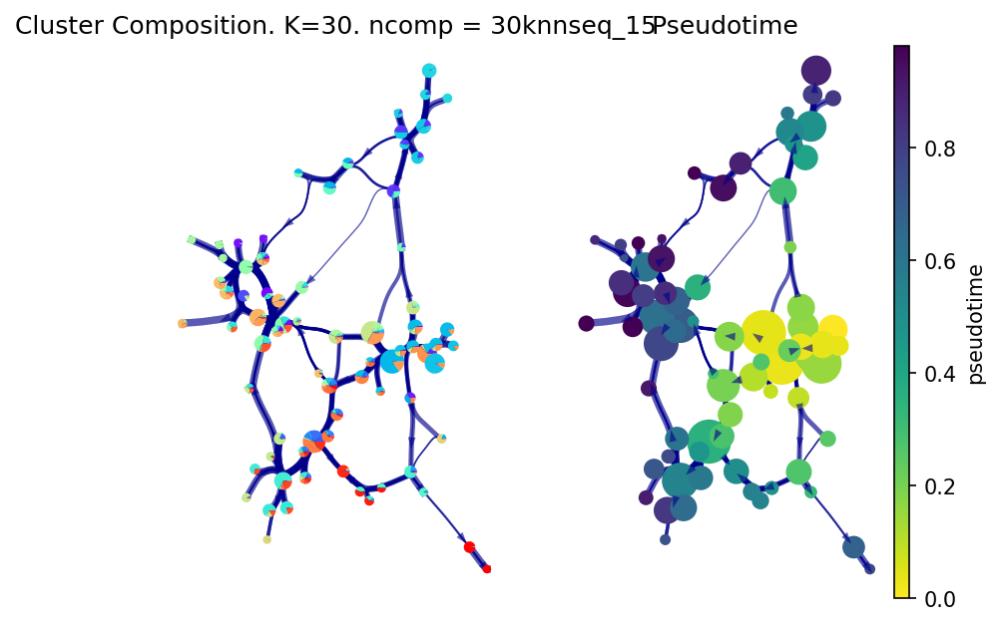

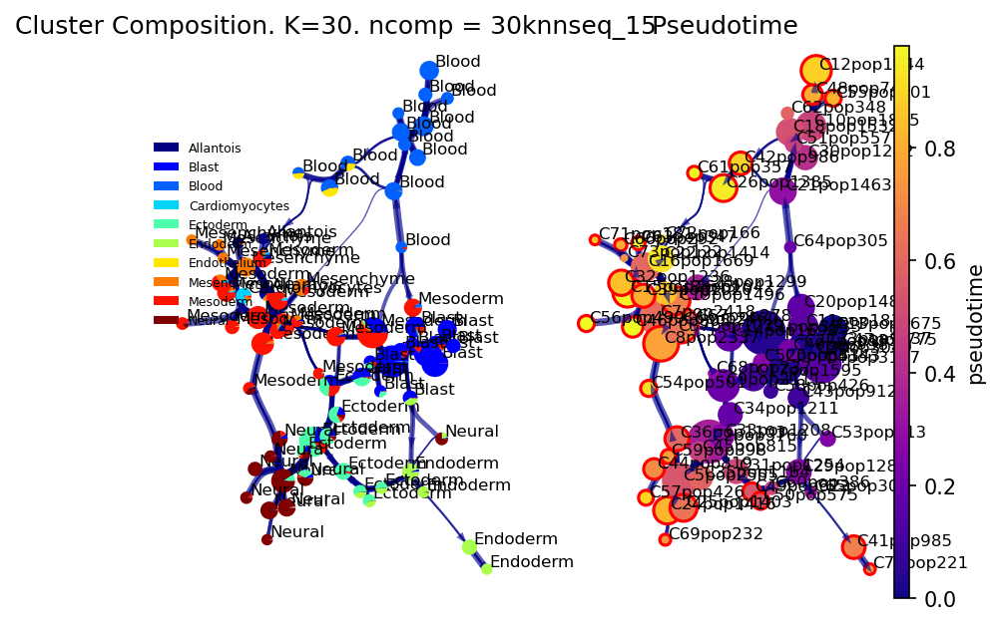

In [28]:
print(f'{datetime.now()}\tPlot Via2.0 cluster graph')
'''
via.draw_piechart_graph(via_object=v0, cmap_piechart='viridis_r', cmap='viridis_r',
                        reference_labels=stage_label_numeric, headwidth_arrow=0.4,
                        highlight_terminal_clusters=True)
'''
via.draw_piechart_graph(via_object=v0, headwidth_arrow=0.4, show_legend=False, ax_text=False, pie_size_scale=0.6,
                        highlight_terminal_clusters=False)
via.draw_piechart_graph(via_object=v0, cmap_piechart='jet', cmap='plasma',
                        reference_labels=coarse_cell_type_label, headwidth_arrow=0.4,
                        highlight_terminal_clusters=True)


### Compute Atlas single-cell embedding

1. On the very first run we need to compute the graph-network representation features (n_dim = 64 or 128 is enough). We will use these instead of Principal Components as they can preserve global network structure a bit better. To compute the graph-network features run the code called **STEP 1**. This automatically saves a csv.file of n_samples x n_dim in the folder indicated by *working_directory* and also returns a ndarray rw_features_input
2. If you have already run **STEP 1** in a prior run, then you can Skip STEP1 and instead run the code in **STEP 2** to load the feature matrix from the csv file saved to the location from **STEP 1**
3. Compute the atlas embedding
4. Plot based on cell type or other attributes

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


2023-09-20 10:57:23.986672	Start Atlas embedding computation
2023-09-20 10:57:23.987906	Plot Atlas Embedding


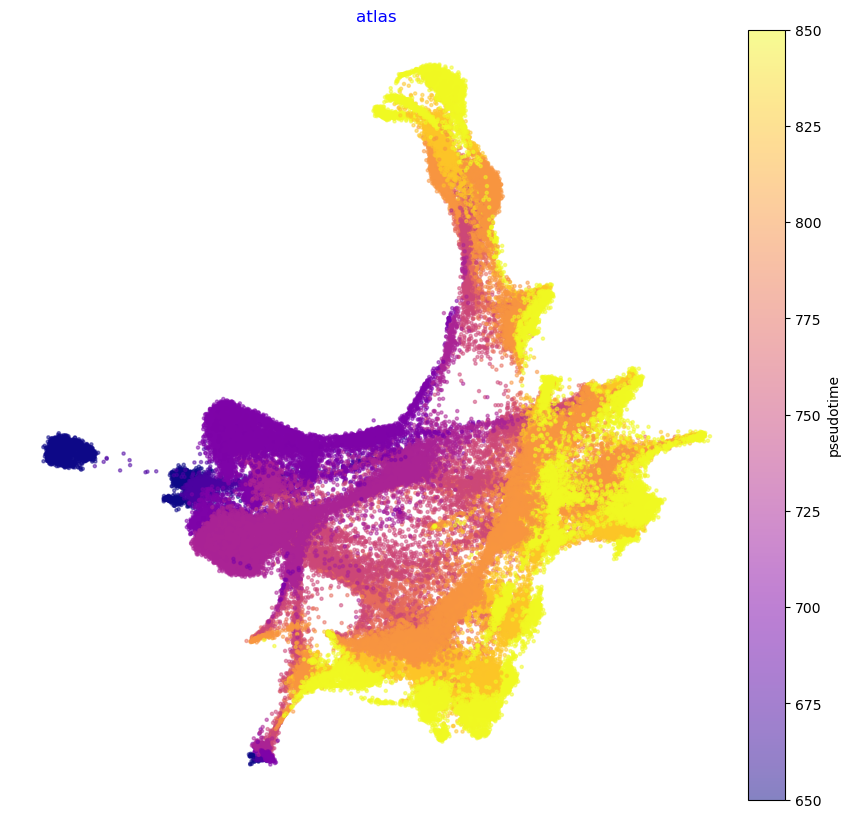

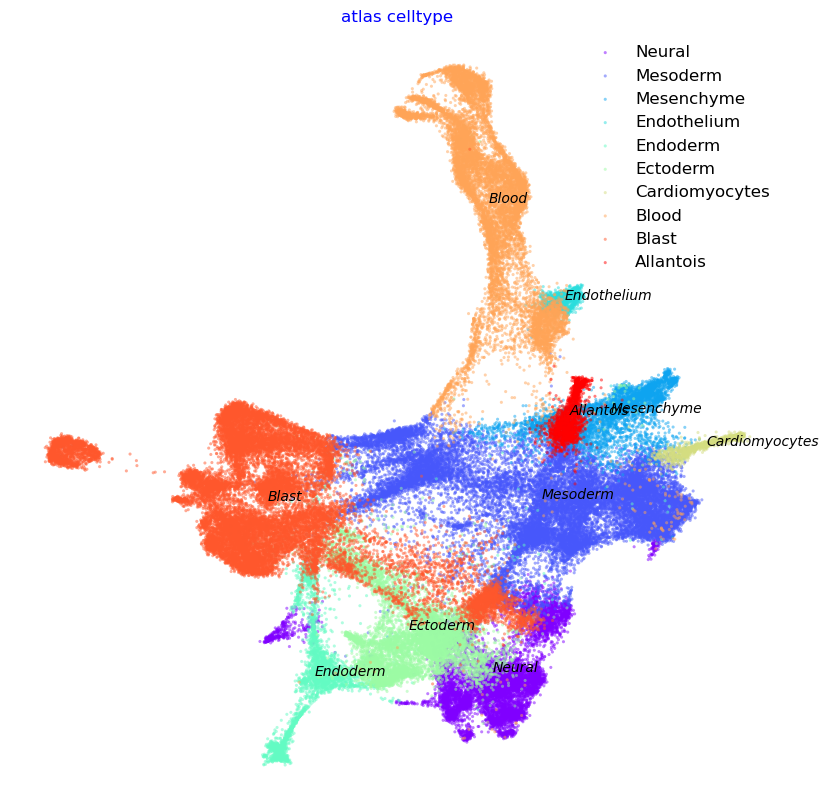

In [9]:
compute_features=False
if compute_features:
    #STEP 1
    feature_rep_fpath, rw_features_input = via.rw2_feature_representation(via_object=v0,                                                                      working_directory='/home/user/Trajectory/Datasets/Pijuan_Gastrulation/RW2/Sept/',  n_dim=64)

load_rw2_features=False
if load_rw2_features:
    #STEP 2
    rw_features_input = pd.read_csv('/home/user/Trajectory/Datasets/Pijuan_Gastrulation/RW2/Sept/pc30_knn30rw2_428_ndim64_qin1_pret0.5.csv')  # pc30_knn30kseq15krev15RW2_emd_122.csv')
    rw_features_input= rw_features_input.drop(['Unnamed: 0'], axis=1).values
    X_input =rw_features_input[:, 0:n_pcs]
else: X_input = adata.obsm['RW2_features']
print(f'{datetime.now()}\tStart Atlas embedding computation')
compute_atlas_embedding = False
if compute_atlas_embedding:
    #STEP 3
    atlas_embedding = via.via_atlas_emb(via_object=v0, X_input=X_input, init_pos='via', min_dist=0.2)
else: atlas_embedding = embedding=adata.obsm['X_Via2_atlas']

print(f'{datetime.now()}\tPlot Atlas Embedding')
f1, ax = via.plot_scatter(embedding=atlas_embedding, labels=stage_label_numeric, cmap='plasma', s=5,
                          alpha=0.5, edgecolors='None',
                          title='atlas', text_labels=False)
f1.set_size_inches(10, 10)

f2, ax = via.plot_scatter(embedding=atlas_embedding, labels=coarse_cell_type_label, title='atlas celltype',
                          alpha=0.5, s=5)
f2.set_size_inches(10, 10)
plt.show()

#asjd;fl

In [ ]:
print(f'{datetime.now()}\tCreate edgebundle')
decay = 0.6  # increasing decay increasing merging of edges
i_bw = 0.02  # 0.03 for lineage prob#0.02 #increasing bw increases merging of edges#0.02 for Atlas
global_visual_pruning = 0.6  # 0.55
v0.embedding = atlas_embedding
import random

pseudorand = random.randint(0, 1000)
n_milestones = 150  # 150 for atlas #300 for lineage probabilities #100
hammerbundle_dict = via.make_edgebundle_milestone(via_object=v0, n_milestones=n_milestones, decay=decay,
                                                  initial_bandwidth=i_bw, global_visual_pruning=global_visual_pruning,
                                                  sc_labels_numeric=stage_label_numeric)
v0.hammerbundle_milestone_dict = hammerbundle_dict  # make the hmbd in one shot to be used for all plots

2023-09-20 16:12:47.967932	Plot edgebundle
inside add sc embedding second if


"\nfig, ax = via.plot_edge_bundle(via_object=v0, decay=decay, initial_bandwidth=i_bw, add_sc_embedding=True, sc_labels_expression=stage_label_numeric,sc_scatter_alpha=0.15,scatter_size_sc_embedding=10,\n                     linewidth_bundle=3, alpha_bundle_factor=1.5, headwidth_bundle=0.2,\n                     cmap='plasma_r', facecolor='white', size_scatter=1, alpha_scatter=0.1,  global_visual_pruning=global_visual_pruning,\n                     scale_scatter_size_pop=True, fontsize_labels=16,\n                     extra_title_text='EStage decay:' + str(decay) + ' bw:' + str(i_bw)+'globalVisPruning:'+str(global_visual_pruning),\n                     text_labels=False, sc_labels=cell_type_label, use_sc_labels_sequential_for_direction=True)\nfig.set_size_inches(35, 25)\nplt.show()\n"

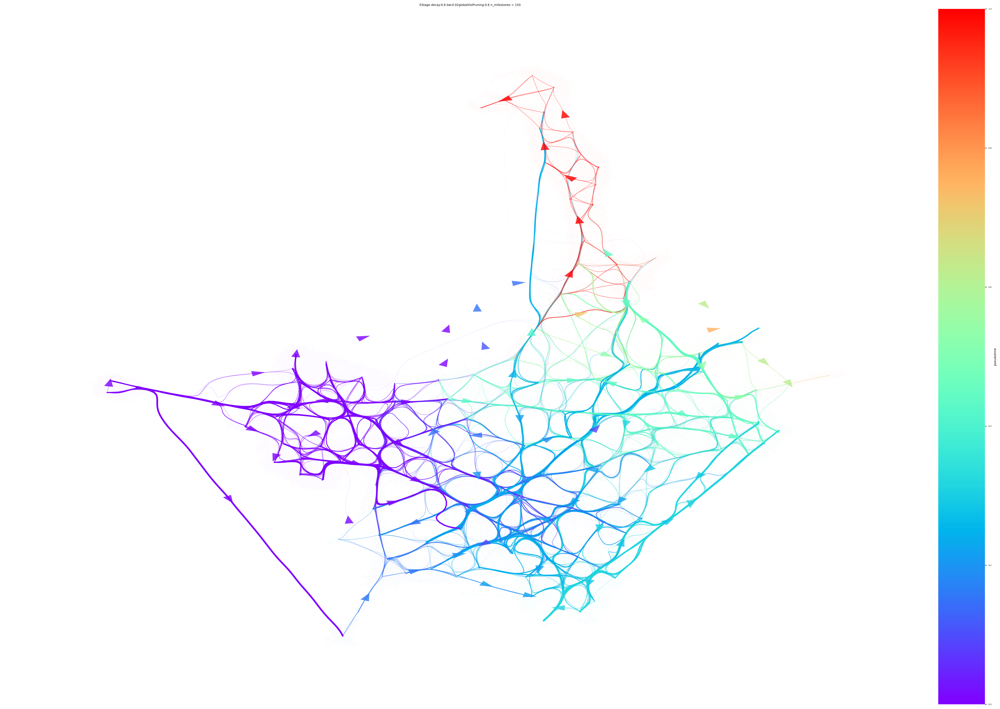

In [29]:
print(f'{datetime.now()}\tPlot edgebundle')

dict_coarse = {'Neural': 2.5, 'Mesoderm': 3.5, 'neural_crest': 4.5, 'Mesenchyme': 5,
                   'Endothelium': 7, 'Endoderm': 1.25,
                   'Ectoderm': 2, 'Cardiomyocytes': 6, 'Blood': 8, 'Blast': 0,'Allantois':4}
fig, ax = via.plot_edge_bundle(via_object=v0, decay=decay, initial_bandwidth=i_bw, add_sc_embedding=True,
                               sc_labels_expression=[dict_coarse[coarse_cell_type_label[i]] for i in
                                                     range(len(v0.labels))], sc_scatter_alpha=0.01,
                               scatter_size_sc_embedding=5,
                               linewidth_bundle=3, alpha_bundle_factor=1.5, headwidth_bundle=0.2,
                               cmap='rainbow', facecolor='white', size_scatter=1, alpha_scatter=0.1,
                               global_visual_pruning=global_visual_pruning,
                               scale_scatter_size_pop=True, fontsize_labels=16,
                               extra_title_text='EStage decay:' + str(decay) + ' bw:' + str(
                                   i_bw) + 'globalVisPruning:' + str(global_visual_pruning),
                               text_labels=False, sc_labels=cell_type_label, use_sc_labels_sequential_for_direction=True)
fig.set_size_inches(35, 25)

'''
fig, ax = via.plot_edge_bundle(via_object=v0, decay=decay, initial_bandwidth=i_bw, add_sc_embedding=True, sc_labels_expression=stage_label_numeric,sc_scatter_alpha=0.15,scatter_size_sc_embedding=10,
                     linewidth_bundle=3, alpha_bundle_factor=1.5, headwidth_bundle=0.2,
                     cmap='plasma_r', facecolor='white', size_scatter=1, alpha_scatter=0.1,  global_visual_pruning=global_visual_pruning,
                     scale_scatter_size_pop=True, fontsize_labels=16,
                     extra_title_text='EStage decay:' + str(decay) + ' bw:' + str(i_bw)+'globalVisPruning:'+str(global_visual_pruning),
                     text_labels=False, sc_labels=cell_type_label, use_sc_labels_sequential_for_direction=True)
fig.set_size_inches(35, 25)
plt.show()
'''

### Plot single-cell lineage probabilities

2023-09-20 14:51:04.847004	Plot single-cell lineage probabilities
location of 15 is at [6] and 6
location of 69 is at [21] and 21
location of 24 is at [23] and 23
location of 71 is at [16] and 16
location of 50 is at [28] and 28
location of 36 is at [19] and 19


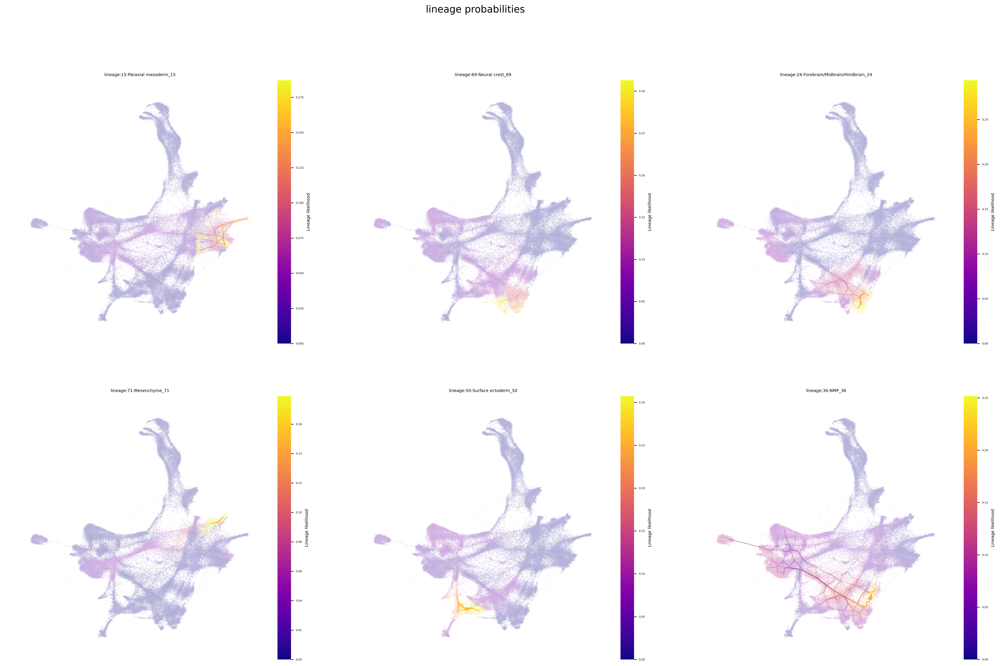

In [21]:
print(f'{datetime.now()}\tPlot single-cell lineage probabilities')

select_terminal_clusters =  [15, 69, 24, 71, 50, 36]
fig, ax = via.plot_edge_bundle(via_object=v0, lineage_pathway=select_terminal_clusters, linewidth_bundle=2, alpha_bundle_factor=5, headwidth_bundle=0.4,
                                           size_scatter=0.05, alpha_scatter=0.3, sc_scatter_size=3, sc_scatter_alpha=0.3,
                                           use_sc_labels_sequential_for_direction=True)
fig.suptitle('lineage probabilities', fontsize=14)
fig.set_size_inches(25, 15)


### Plot gene trends 

100 q_memory


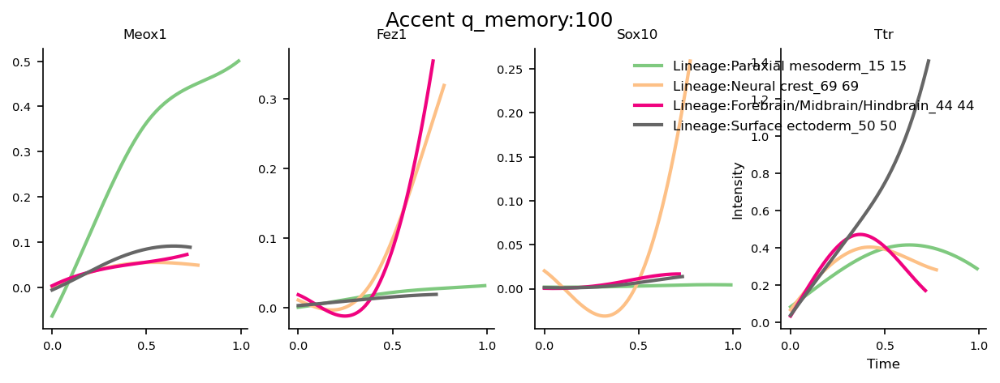

In [24]:
genes=['Meox1','Fez1','Sox10','Ttr']
df_genes_sc = pd.DataFrame(adata[:, genes].X.todense(), columns=genes)

select_terminal_clusters = [15, 69, 44, 50]
spline_order = 3
n_splines = 5
fig, axs= via.get_gene_expression(via_object=v0, gene_exp=df_genes_sc, marker_genes=genes,
                        marker_lineages=select_terminal_clusters,  # 56,50,25
                        n_splines=n_splines, spline_order=spline_order, cmap='Accent')
print(q_memory,'q_memory')
plt.suptitle('Accent q_memory:' + str(q_memory))
fig.set_size_inches(10, 3)

### Plot stream plot using hybrid pseudotime-RNAvelocity based directionality

2023-09-20 14:53:34.466470	Plot stream plot


/home/user/anaconda3/envs/Via2Env_py10/lib/python3.10/site-packages/scipy/sparse/_index.py:146: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)
/home/user/PycharmProjects/Via2_May2023_py310/core_working_rw2.py:1325: RuntimeWarning: divide by zero encountered in divide
  T = T.multiply(csr_matrix(1.0 / np.abs(T).sum(1)))  # rows sum to one
/home/user/PycharmProjects/Via2_May2023_py310/core_working_rw2.py:1349: RuntimeWarning: invalid value encountered in divide
  dX /= l2_norm(dX)[:, None]
/home/user/PycharmProjects/Via2_May2023_py310/core_working_rw2.py:1356: RuntimeWarning: Mean of empty slice.
  V_emb[i] = probs.dot(dX) - probs.mean() * dX.sum(0)
/home/user/anaconda3/envs/Via2Env_py10/lib/python3.10/site-packages/numpy/core/_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


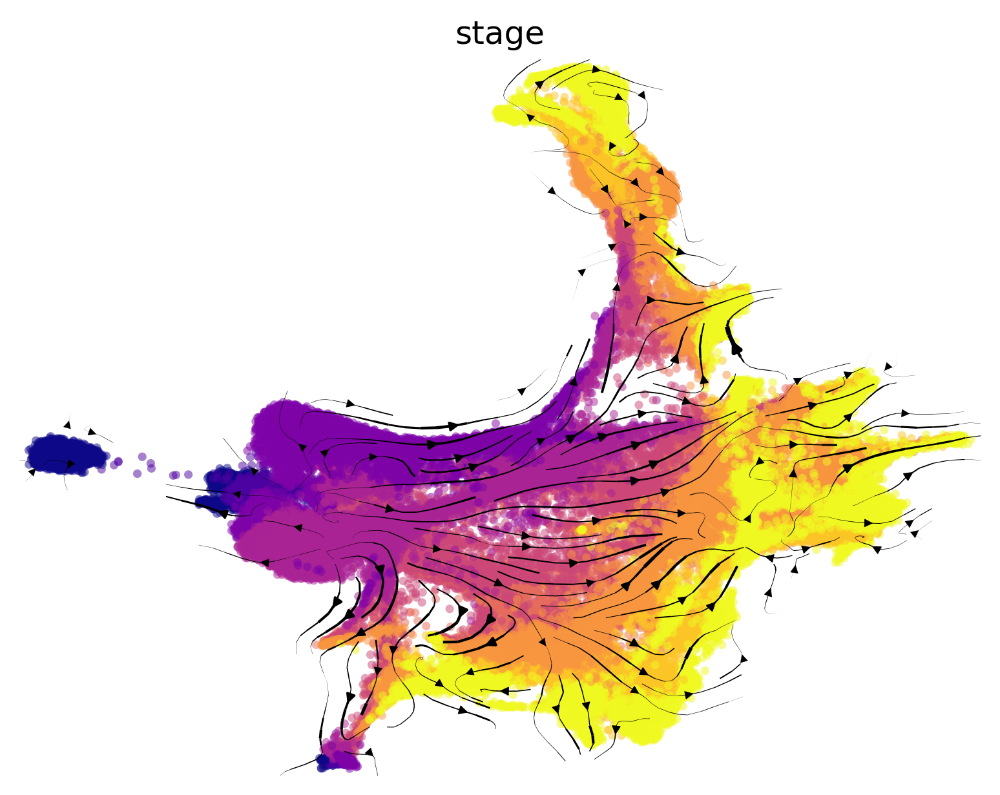

In [25]:
print(f'{datetime.now()}\tPlot stream plot')
via.via_streamplot(v0, embedding=atlas_embedding, scatter_size=10, scatter_alpha=0.5, marker_edgewidth=0.01, density_stream=2,
                   density_grid=1, smooth_transition=2, smooth_grid=0.5,  title='stage', labels=stage_label_numeric, cmap='plasma')
plt.show()